In [5]:
from astropy.io import fits
import numpy as np
from astropy.visualization import simple_norm
import pylab as plt
from astropy import wcs
import os
from reproject import reproject_interp
import PIL
#import pyavm
import shutil
from matplotlib.colors import LinearSegmentedColormap
def save_rgb(img, filename, avm=None, flip=-1):
    img = (img*256)
    img[img<0] = 0
    img[img>255] = 255
    img = img.astype('uint8')
    img = PIL.Image.fromarray(img[::flip,:,:])
    img.save(filename)
    if avm is not None:
        base = os.path.basename(filename)
        dir = os.path.dirname(filename)
        avmname = os.path.join(dir, 'avm_'+base)
        avm.embed(filename, avmname)
        shutil.move(avmname, filename)
    return img



In [6]:

image_filenames ={
    "f140m": "/orange/adamginsburg/jwst/w51/F140M/pipeline/jw06151-o001_t001_nircam_clear-f140m-merged_i2d.fits",
    "f150w": "/orange/adamginsburg/jwst/w51/F150W/pipeline/jw06151-o001_t001_nircam_clear-f150w-merged_i2d.fits",
    "f162m": "/orange/adamginsburg/jwst/w51/F162M/pipeline/jw06151-o001_t001_nircam_clear-f162m-merged_i2d.fits",
    "f182m": "/orange/adamginsburg/jwst/w51/F182M/pipeline/jw06151-o001_t001_nircam_clear-f182m-merged_i2d.fits",
    "f187n": "/orange/adamginsburg/jwst/w51/F187N/pipeline/jw06151-o001_t001_nircam_clear-f187n-merged_i2d.fits",
    "f210m": "/orange/adamginsburg/jwst/w51/F210M/pipeline/jw06151-o001_t001_nircam_clear-f210m-merged_i2d.fits",
    "f335m": "/orange/adamginsburg/jwst/w51/F300M/pipeline/jw06151-o001_t001_nircam_clear-f335m-merged_i2d.fits",
    "f360m": "/orange/adamginsburg/jwst/w51/F360M/pipeline/jw06151-o001_t001_nircam_clear-f360m-merged_i2d.fits",
    "f405n": "/orange/adamginsburg/jwst/w51/F405N/pipeline/jw06151-o001_t001_nircam_clear-f405n-merged_i2d.fits",
    "f410m": "/orange/adamginsburg/jwst/w51/F410M/pipeline/jw06151-o001_t001_nircam_clear-f410m-merged_i2d.fits", # weird, the filename is different from what is downloaded with the STScI pipeline...
    "f480m": "/orange/adamginsburg/jwst/w51/F480M/pipeline/jw06151-o001_t001_nircam_clear-f480m-merged_i2d.fits",
    "f560w": "/orange/adamginsburg/jwst/w51/F560W/pipeline/jw06151-o002_t001_miri_f560w_i2d.fits",
    "f770w": "/orange/adamginsburg/jwst/w51/F770W/pipeline/jw06151-o002_t001_miri_f770w_i2d.fits",
    "f1000w": "/orange/adamginsburg/jwst/w51/F1000W/pipeline/jw06151-o002_t001_miri_f1000w_i2d.fits",
    "f1280w": "/orange/adamginsburg/jwst/w51/F1280W/pipeline/jw06151-o002_t001_miri_f1280w_i2d.fits",
    "f1500w": "/orange/adamginsburg/jwst/w51/F1500W/pipeline/jw06151-o002_t001_miri_f1500w_i2d.fits",
    "f2100w": "/orange/adamginsburg/jwst/w51/F2100W/pipeline/jw06151-o002_t001_miri_f2100w_i2d.fits",
    
}

image_sub_filenames = {
    "f405n-f410m": "/orange/adamginsburg/jwst/w51/F405_minus_F410cont_pipeline_v0.1.fits",
    "f410m-f405n": "/orange/adamginsburg/jwst/w51/F410_minus_F405_fractional_bandwidth_pipeline_v0.1.fits",
    "f187n-f182m": "/orange/adamginsburg/jwst/w51/F187_minus_F182cont_pipeline_v0.1.fits",

}


In [7]:
from astropy.wcs import WCS

reproj_dir = '/orange/adamginsburg/jwst/w51/data_reprojected_480/'
repr480_image_filenames = {x: y.replace("i2d", "i2d_reprj_f480") for x,y in image_filenames.items()}
repr480_image_filenames = {x: (reproj_dir+os.path.basename(y)) for x,y in repr480_image_filenames.items()}





In [11]:

ref_fits = fits.open(repr480_image_filenames['f480m'])
tgt_header = fits.getheader(repr480_image_filenames['f480m'], ext=('SCI', 1))
wcs_header = WCS(tgt_header)

Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


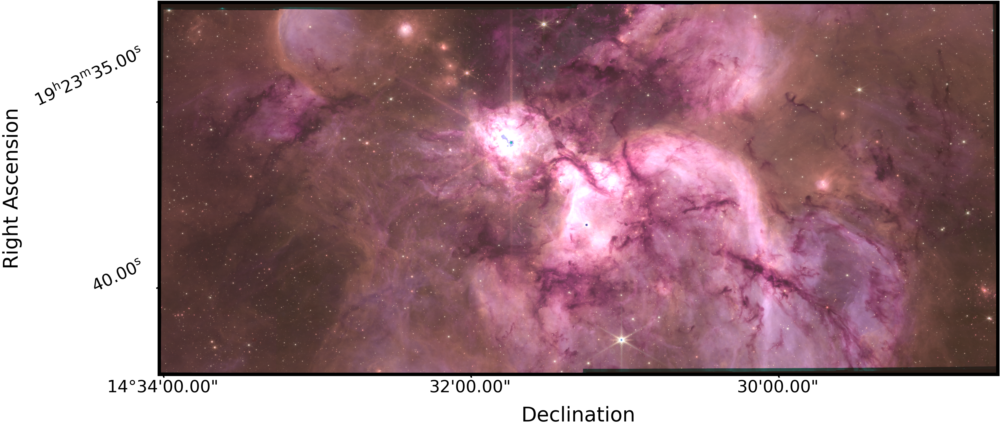

In [12]:
from matplotlib import colors
import astropy.units as u
import matplotlib as mpl
plt.rcParams['axes.labelsize']=60
plt.rcParams['xtick.labelsize']=50
plt.rcParams['ytick.labelsize']=50
plt.rcParams['axes.titlesize']=60
mpl.rcParams['axes.linewidth'] = 10
mpl.rcParams['xtick.major.size'] = 10
mpl.rcParams['xtick.major.width'] = 4
mpl.rcParams['xtick.minor.size'] = 5
mpl.rcParams['xtick.minor.width'] = 2
mpl.rcParams['ytick.major.size'] = 10
mpl.rcParams['ytick.major.width'] = 4
mpl.rcParams['ytick.minor.size'] = 5
mpl.rcParams['ytick.minor.width'] = 2
magenta_cmap = LinearSegmentedColormap.from_list('magenta', [(0,0,0), (1,0,1)])
yellow_cmap  = LinearSegmentedColormap.from_list('yellow',  [(0,0,0), (1,1,0)])
cyan_cmap    = LinearSegmentedColormap.from_list('cyan',    [(0,0,0), (0,1,1)])

# Opacity for each layer (0=transparent, 1=opaque)
alpha_magenta = 0.7
alpha_yellow  = 0.78
alpha_cyan    = 0.74

# Normalize each image
#norm1 = simple_norm(img1, stretch='asinh', min_percent=1, max_percent=99)
#norm2 = simple_norm(img2, stretch='asinh', min_percent=1, max_percent=99)
#norm3 = simple_norm(img3, stretch='asinh', min_percent=1, max_percent=97)

img1 = fits.getdata(repr480_image_filenames['f405n'], ext=('SCI', 1))
img2 = fits.getdata(repr480_image_filenames['f360m'], ext=('SCI', 1))
img3 = fits.getdata(repr480_image_filenames['f187n'], ext=('SCI', 1))
norm1 = simple_norm(img1, stretch='log', vmin=-2.12, vmax=1967)
norm2 = simple_norm(img2, stretch='log', vmin=-2.12, vmax=1597)
norm3 = simple_norm(img3, stretch='log', vmin=-2.12, vmax=9431)

# Map each image to its colormap and convert to RGB arrays
magenta_rgb = magenta_cmap(norm1(img1))[...,:3] * alpha_magenta
yellow_rgb  = yellow_cmap(norm2(img2))[...,:3]  * alpha_yellow
cyan_rgb    = cyan_cmap(norm3(img3))[...,:3]    * alpha_cyan

# Combine by summing and clipping
composite = magenta_rgb + yellow_rgb + cyan_rgb
composite = np.clip(composite, 0, 1)

fig = plt.figure(figsize=(48,20), )
ax = fig.add_subplot(111, projection=wcs_header)

ax.imshow(composite, origin='lower', )
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
ra.set_major_formatter('hh:mm:ss.ss')
dec.set_major_formatter('dd:mm:ss.ss')
ra.set_axislabel('Right Ascension')
ra.set_ticklabel(rotation=25, pad=30)
dec.set_axislabel('Declination')

ra.set_ticks_position('l')
ra.set_ticklabel_position('l')
ra.set_axislabel_position('l')
dec.set_ticks_position('b')
dec.set_ticklabel_position('b')
dec.set_axislabel_position('b')
plt.savefig('rgbs/overview_187-360-405.png', dpi=100, bbox_inches='tight')

In [13]:
import reproject

new_basepath = '/orange/adamginsburg/jwst/w51/data_reprojected_480/'
repr480_image_filenames = {x: y.replace("i2d", "i2d_reprj_f480") for x,y in image_filenames.items()}
repr480_image_filenames = {x: (new_basepath+os.path.basename(y)) for x,y in repr480_image_filenames.items()}
repr480_image_sub_filenames = {x: y.replace("i2d", "i2d_reprj_f480") for x,y in image_sub_filenames.items()}
repr480_image_sub_filenames = {x: (new_basepath+os.path.basename(y)) for x,y in repr480_image_sub_filenames.items()}


for filtername in ['f162m', 'f560w', 'f770w']:
    if not os.path.exists(repr480_image_filenames[filtername]):
        print(f"Reprojecting {filtername} {image_filenames[filtername]} to {repr480_image_filenames[filtername]}")
        result,_ = reproject.reproject_interp(image_filenames[filtername], tgt_header, hdu_in='SCI')
        hdu = fits.PrimaryHDU(data=result, header=tgt_header)
        hdu.writeto(repr480_image_filenames[filtername], overwrite=True)




Set DATE-AVG to '2025-05-06T16:59:22.421' from MJD-AVG.
Set DATE-END to '2025-05-06T17:21:22.408' from MJD-END'. [astropy.wcs.wcs]
Set OBSGEO-B to   -25.271881 from OBSGEO-[XYZ].
Set OBSGEO-H to 1611441536.798 from OBSGEO-[XYZ]'. [astropy.wcs.wcs]


/home/t.yoo/anaconda3/envs/py311/lib/python3.11/site-packages/regions/shapes/rectangle.py:205: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return Rectangle(xy=xy, width=width, height=height,
/home/t.yoo/anaconda3/envs/py311/lib/python3.11/site-packages/regions/shapes/circle.py:160: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return Circle(xy=xy, radius=radius, **mpl_kwargs)
/home/t.yoo/anaconda3/envs/py311/lib/python3.11/site-packages/regions/shapes/ellipse.py:209: UserWarning: Setting the 'color' property will override the edgecolor or facecolor properties.
  return Ellipse(xy=xy, width=width, height=height, angle=angle,


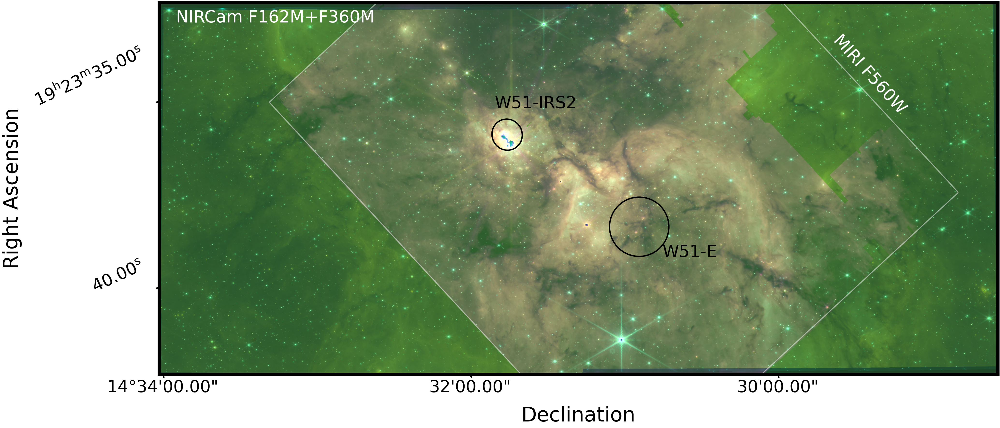

In [14]:
from regions import Regions
reg_dir = '/orange/adamginsburg/w51/TaehwaYoo/region_jwst_highlights/'
nircam_footprint_reg = Regions.read(reg_dir+'nircam_footprint.reg')
miri_footprint_reg = Regions.read(reg_dir+'miri_footprint.reg')
w51e_reg=Regions.read(reg_dir+'w51e_area.reg')
w51n_reg=Regions.read(reg_dir+'w51n_area.reg')

img3 = fits.getdata(repr480_image_filenames['f162m'])
img2 = fits.getdata(repr480_image_filenames['f360m'])
img1 = fits.getdata(repr480_image_filenames['f560w'])
ref_fits = fits.open(image_filenames['f480m'])
tgt_header = fits.getheader(image_filenames['f480m'], ext=('SCI', 1))

wcs_header = WCS(tgt_header)
nircam_footprint_pix_reg = nircam_footprint_reg[0].to_pixel(wcs_header)
miri_footprint_pix_reg = miri_footprint_reg[0].to_pixel(wcs_header)
w51e_pix_reg = w51e_reg[0].to_pixel(wcs_header)
w51n_pix_reg = w51n_reg[0].to_pixel(wcs_header)
# Opacity for each layer (0=transparent, 1=opaque)
alpha_magenta = 0.41
alpha_yellow  = 0.66
alpha_cyan    = 0.84

# Normalize each image
#norm1 = simple_norm(img1, stretch='asinh', min_percent=1, max_percent=99)
#norm2 = simple_norm(img2, stretch='asinh', min_percent=1, max_percent=99)
#norm3 = simple_norm(img3, stretch='asinh', min_percent=1, max_percent=97)

norm3 = simple_norm(img3, stretch='log', vmin=-2.12, vmax=798)
norm2 = simple_norm(img2, stretch='log', vmin=-2.12, vmax=798)
norm1 = simple_norm(img1, stretch='log', vmin=-2.12, vmax=6958)

magenta_cmap = LinearSegmentedColormap.from_list('magenta', [(0,0,0), (1,0,1)])
yellow_cmap  = LinearSegmentedColormap.from_list('yellow',  [(0,0,0), (1,1,0)])
cyan_cmap    = LinearSegmentedColormap.from_list('cyan',    [(0,0,0), (0,1,1)])

# Map each image to its colormap and convert to RGB arrays
magenta_rgb = magenta_cmap(norm1(img1))[...,:3] * alpha_magenta
yellow_rgb  = yellow_cmap(norm2(img2))[...,:3]  * alpha_yellow
cyan_rgb    = cyan_cmap(norm3(img3))[...,:3]    * alpha_cyan

# Combine by summing and clipping
composite = magenta_rgb + yellow_rgb + cyan_rgb
composite = np.clip(composite, 0, 1)

fig = plt.figure(figsize=(48,20), )
ax = fig.add_subplot(111, projection=wcs_header)

ax.imshow(composite, origin='lower', )

ax.add_artist(nircam_footprint_pix_reg.as_artist(color='w', alpha=0.5, lw=3))
ax.add_artist(miri_footprint_pix_reg.as_artist(color='w', alpha=0.5, lw=3))
ax.add_artist(w51e_pix_reg.as_artist(color='k',  lw=4))
ax.add_artist(w51n_pix_reg.as_artist(color='k',  lw=4))
ax.text(0.02*composite.shape[1], 0.98*composite.shape[0], 'NIRCam F162M+F360M', color='w', fontsize=50, ha='left', va='top')
ax.text(0.8*composite.shape[1], 0.92*composite.shape[0], 'MIRI F560W', color='w', fontsize=50, ha='left', va='top', rotation=-48)
ax.text(0.6*composite.shape[1], 0.35*composite.shape[0], 'W51-E', color='k', fontsize=50, ha='left', va='top')
ax.text(0.4*composite.shape[1], 0.75*composite.shape[0], 'W51-IRS2', color='k', fontsize=50, ha='left', va='top')
ax.set_xlabel('RA')
ax.set_ylabel('Dec')

ra = lon = ax.coords['ra']
dec = lat = ax.coords['dec']
ra.set_major_formatter('hh:mm:ss.ss')
dec.set_major_formatter('dd:mm:ss.ss')
ra.set_axislabel('Right Ascension')
ra.set_ticklabel(rotation=25, pad=30)
dec.set_axislabel('Declination')

ra.set_ticks_position('l')
ra.set_ticklabel_position('l')
ra.set_axislabel_position('l')
dec.set_ticks_position('b')
dec.set_ticklabel_position('b')
dec.set_axislabel_position('b')
plt.savefig('rgbs/overview_162-360-560.png', dpi=100, bbox_inches='tight')